# Grad-CAM on album covers (all layers)

I [trained](https://github.com/dhth/album-art-genre-classifier) a ResNet-50 to classify album art covers as either belonging to the genre `popular` (supposed to include pop, rap, and hip-hop) or `rock`.
Using Grad-CAM to generate heat-maps at different points along the network to see why the model makes certain predictions.

In [0]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [0]:
# !curl https://course-v3.fast.ai/setup/colab | bash

In [0]:
# !apt-get -qq install ffmpeg
# restart kernel after install

In [0]:
# DRIVE_BASE_PATH = "/content/gdrive/My\ Drive/Colab\ Notebooks/"

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from fastai import *
from fastai.vision import *

In [4]:
from fastai import version as fastai_version

In [5]:
print(f'fastai version -> {fastai_version.__version__}')

fastai version -> 1.0.33


In [6]:
bs = 32  #batch size

In [38]:
path = Path('../../../album-art-genre-classifier/local_only_data/exp4/')

In [28]:
src = ImageItemList.from_folder(path).random_split_by_pct(0.2, seed=2)

In [13]:
tfms = get_transforms(do_flip=False)

In [34]:
def get_data(size, bs, padding_mode='reflection'):
    return (src.label_from_re(r'([\d]+).jpg$')
           .transform(tfms, size=size, padding_mode=padding_mode)
           .databunch(bs=bs).normalize(imagenet_stats))

In [41]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.08,
        ds_tfms=get_transforms(do_flip=False, max_rotate=0.2, max_warp=0.2), 
                                  size=224, num_workers=4, bs=bs).normalize(imagenet_stats)

### Training data

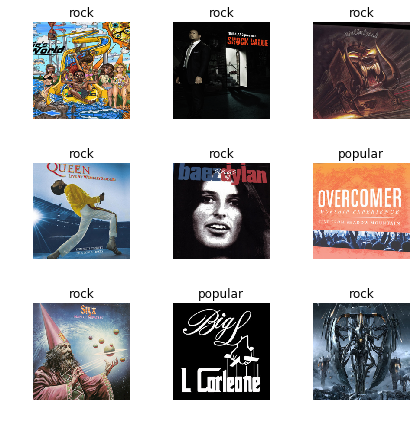

In [42]:
data.show_batch(rows=3, figsize=(6,6))

In [43]:
data.classes

['popular', 'rock']

In [44]:
learn = create_cnn(data, models.resnet50, pretrained=False)

In [46]:
learn.load('exp-4-stage-2-v2');

In [145]:
learn.summary()

Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [32, 64, 112, 112]   9408       True      
______________________________________________________________________
BatchNorm2d          [32, 64, 112, 112]   128        True      
______________________________________________________________________
ReLU                 [32, 64, 112, 112]   0          False     
______________________________________________________________________
MaxPool2d            [32, 64, 56, 56]     0          False     
______________________________________________________________________
Conv2d               [32, 64, 56, 56]     4096       True      
______________________________________________________________________
BatchNorm2d          [32, 64, 56, 56]     128        True      
______________________________________________________________________
Conv2d               [32, 64, 56, 56]     36864      True      
______________________________________________________________

In [117]:
test_data ={
    "rock": [
        "https://upload.wikimedia.org/wikipedia/en/thumb/b/b2/Metallica_-_Master_of_Puppets_cover.jpg/220px-Metallica_-_Master_of_Puppets_cover.jpg",
        "https://i.pinimg.com/originals/c4/7c/26/c47c266343fe9b13e75a7e95efe9e96e.jpg",
        "https://66.media.tumblr.com/3e3e27b913b47453d1274cccbc9c8bda/tumblr_nobgh86B6i1tu537lo1_500.jpg",
        "https://www.billboard.com/files/styles/900_wide/public/media/Green-Day-American-Idiot-album-covers-billboard-1000x1000.jpg",
        "https://www.billboard.com/files/styles/900_wide/public/media/Judas-Priest-British-Steel-album-covers-billboard-1000x1000.jpg",
        "https://www.udiscovermusic.com/wp-content/uploads/2017/08/Beatles-Sgt-Pepper-Cover.jpg",
        "https://metalodyssey.files.wordpress.com/2015/05/iron-maiden-seventh-son-of-a-seventh-son-promo-album-cover-pic-1988-339988immo.jpg",
        "https://reverb-res.cloudinary.com/image/upload/c_scale,w_500/v1415373025/reeves-hendrix-630-80_luaf98.jpg",
        "http://www.liketotally80s.com/wp-content/uploads/2014/08/iron-maiden-killers-album.jpg"
        ],
                    
    "popular": [
        "https://www.billboard.com/files/styles/900_wide/public/media/06-taylor-swift-reputation-album-art-2017-billboard-1240.jpg",
        "https://i.pinimg.com/originals/26/eb/e9/26ebe9788b358c734a2851048d05b12c.jpg",
        "http://artsfuse.org/wp-content/uploads/2011/04/Adele-21-Album-Cover-Art-500x500-300x300.png",
        "https://directlyrics.com/img/upload/ariana-grande-yours-truly-official-album-cover.jpg"
        ]
}

In [112]:
!mkdir local_only_test_pics

In [120]:
for class_name in data.classes:
    for i, el in enumerate(test_data[class_name]):
        print(f'wget -q "{el}" -O local_only_test_pics/{class_name}_{i}.jpg')
        !wget -q "{el}" -O test_pics/{class_name}_{i}.jpg

wget -q "https://www.billboard.com/files/styles/900_wide/public/media/06-taylor-swift-reputation-album-art-2017-billboard-1240.jpg" -O test_pics/popular_0.jpg
wget -q "https://i.pinimg.com/originals/26/eb/e9/26ebe9788b358c734a2851048d05b12c.jpg" -O test_pics/popular_1.jpg
wget -q "http://artsfuse.org/wp-content/uploads/2011/04/Adele-21-Album-Cover-Art-500x500-300x300.png" -O test_pics/popular_2.jpg
wget -q "https://directlyrics.com/img/upload/ariana-grande-yours-truly-official-album-cover.jpg" -O test_pics/popular_3.jpg
wget -q "https://upload.wikimedia.org/wikipedia/en/thumb/b/b2/Metallica_-_Master_of_Puppets_cover.jpg/220px-Metallica_-_Master_of_Puppets_cover.jpg" -O test_pics/rock_0.jpg
wget -q "https://i.pinimg.com/originals/c4/7c/26/c47c266343fe9b13e75a7e95efe9e96e.jpg" -O test_pics/rock_1.jpg
wget -q "https://66.media.tumblr.com/3e3e27b913b47453d1274cccbc9c8bda/tumblr_nobgh86B6i1tu537lo1_500.jpg" -O test_pics/rock_2.jpg
wget -q "https://www.billboard.com/files/styles/900_wide/pub

In [124]:
test_path = Path('test_pics')

In [64]:
from math import ceil

In [127]:
def see_test_files(test_dir_path):
    test_files = test_dir_path.ls()
    
    num_cols = 4
    num_rows = ceil(len(test_files)/num_cols)
    fig,ax = plt.subplots(num_rows,num_cols)
    fig.set_size_inches(num_cols*3,num_rows*3)

    for ind, ax in enumerate(ax.flat):
        if ind>=len(test_files):
            break   
            
        x = open_image(test_files[ind])
        xb,_ = data.one_item(x)
        xb_im = Image(data.denorm(xb)[0])
        xb_im.show(ax)
        title = test_files[ind].stem
        ax.set_title(title)
    
    fig.suptitle('Test images', fontsize=20)

    plt.show()

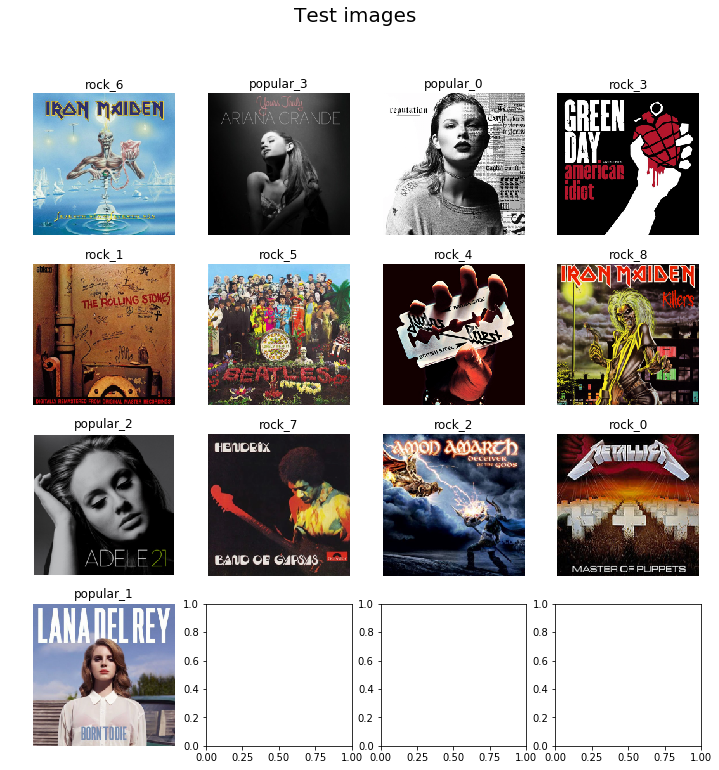

In [128]:
see_test_files(test_path)

In [92]:
from fastai.callbacks.hooks import *

In [93]:
m = learn.model.eval();

## Class-discriminative heat-maps along the network


In [94]:
def class_discriminative_gradients_multi(xb, cat):
    hooks_a = []
    hooks_g = []
    layer_names = []
    
    hooks_a.append(hook_output(m[0][3]))
    hooks_g.append(hook_output(m[0][3], grad=True))
    
    layer_names.append('first conv')

    for ind in [4,5,6,7]:
        for i,el in enumerate(learn.model[0][ind]):
            hooks_a.append(hook_output(el))
            hooks_g.append(hook_output(el, grad=True))
            layer_names.append(f'layer-{ind-3} - conv-{i+1}')
            # layer 1 (layer is combination of resnet blocks) is model[0][4]
    
    preds = m(xb)
    preds[0,int(cat)].backward()
    
    for hook in hooks_a:
        hook.remove()
        
    for hook in hooks_g:
        hook.remove()
    
    return hooks_a,hooks_g,layer_names

In [95]:
class_dict = {}
for i,el in enumerate(data.classes):
    class_dict[el.lower()] = i

In [105]:
def plot_class_discriminative_heatmaps_multi(path, cat, relu=True):
    
    x = open_image(path)
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    
    y = class_dict[cat]
    
    hooks_a,hooks_g,_ = class_discriminative_gradients_multi(xb,y)
    
    num_cols = 4
    num_rows = ceil(len(hooks_a)/num_cols)

    fig,ax = plt.subplots(num_rows,num_cols)
    fig.set_size_inches(num_cols*3,num_rows*3)

    ind = 0
    
    for i in range(num_rows):
        for j in range(num_cols):
            
            if ind>=len(hooks_a):
                break
            
            acts = hooks_a[ind].stored[0].cpu()
            grad = hooks_g[ind].stored[0][0].cpu()

            grad_chan = grad.mean(1).mean(1)
            mult = (acts*grad_chan[...,None,None]).mean(0)

            if relu:
                mult = F.relu(mult)

            xb_im.show(ax[i,j])
            ax[i,j].imshow(mult, alpha=0.6, extent=(0,224,224,0),
                      interpolation='bilinear', cmap='magma');
            ind+=1
            
    plt.show()

In [108]:
def plot_for_both_classes(path):
    
    classes = data.classes
    
    x = open_image(path)
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb_im.show()
    
    pred = learn.predict(x)[0]
    
    print(f'\nModel classifies it as {pred}.')
    
    
    print(f'Grad-CAM heat-maps for maximising --> {classes[0]} <-- score.')
    plot_class_discriminative_heatmaps_multi(path, classes[0])
    print('\n\n')
    print(f'Grad-CAM heat-maps for maximising --> {classes[1]} <-- score.')
    plot_class_discriminative_heatmaps_multi(path, classes[1])
    print('\n\n\t\t-------------\n\n')


Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


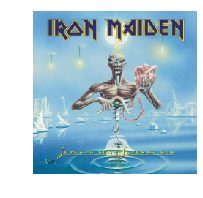

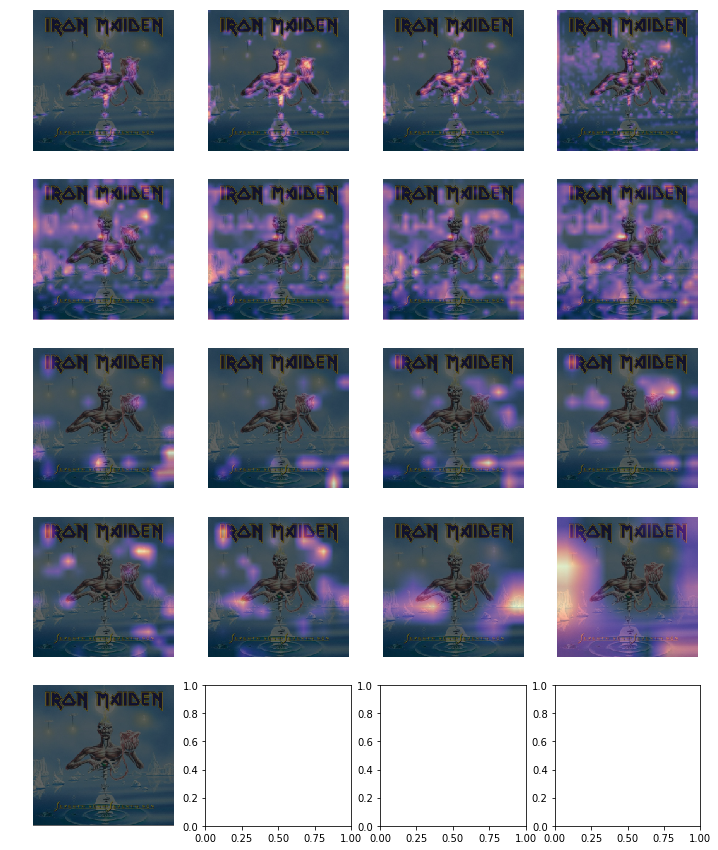




Grad-CAM heat-maps for maximising --> rock <-- score.


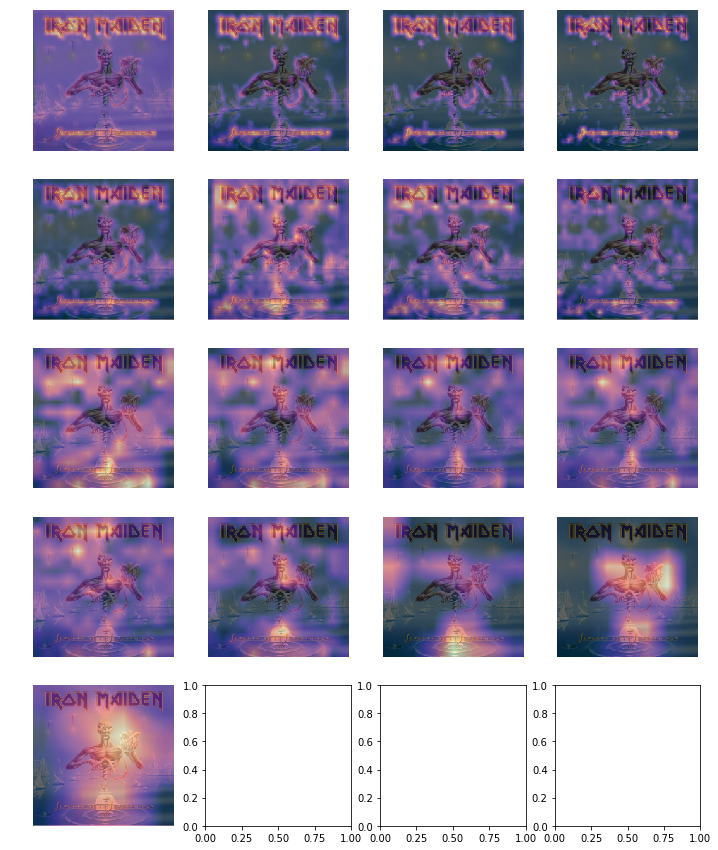



		-------------



Model classifies it as popular.
Grad-CAM heat-maps for maximising --> popular <-- score.


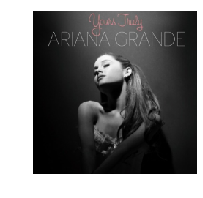

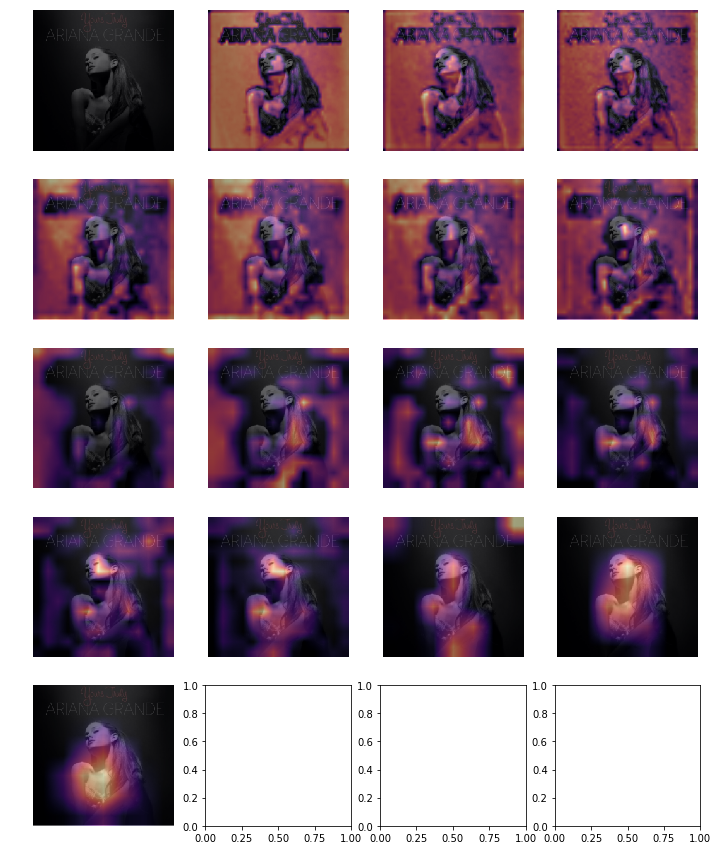




Grad-CAM heat-maps for maximising --> rock <-- score.


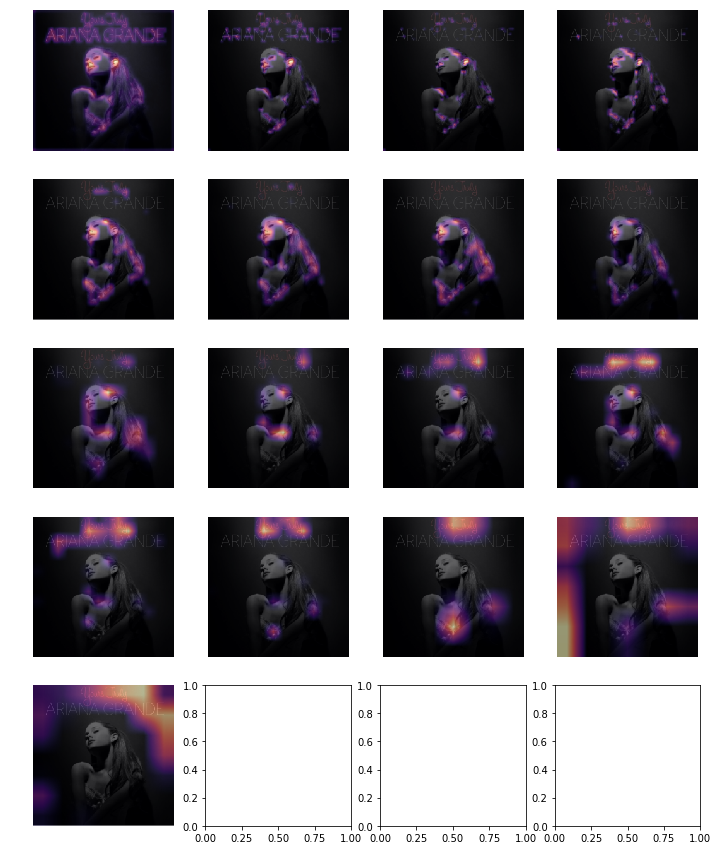



		-------------



Model classifies it as popular.
Grad-CAM heat-maps for maximising --> popular <-- score.


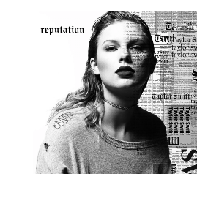

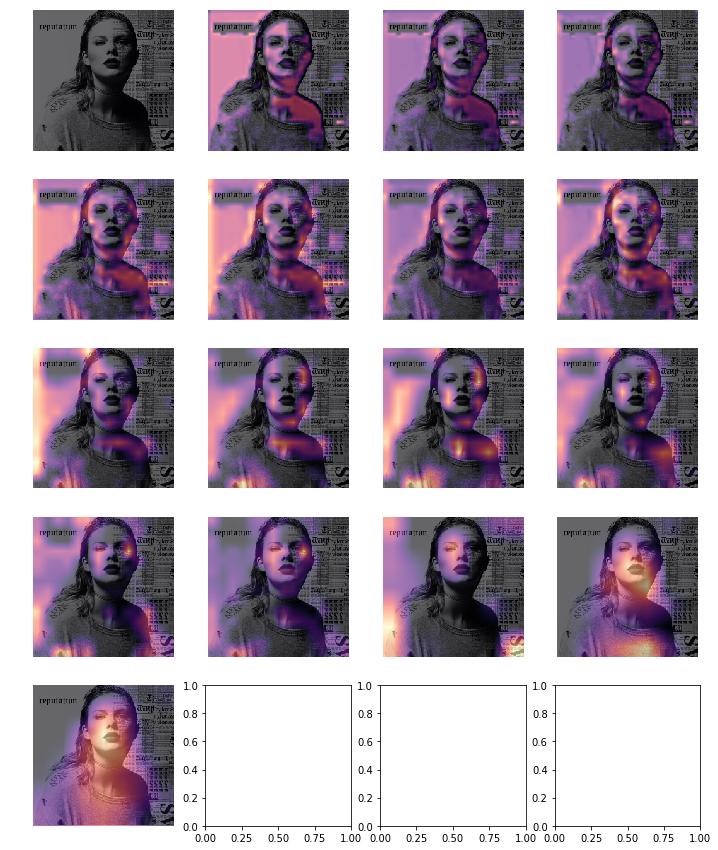




Grad-CAM heat-maps for maximising --> rock <-- score.


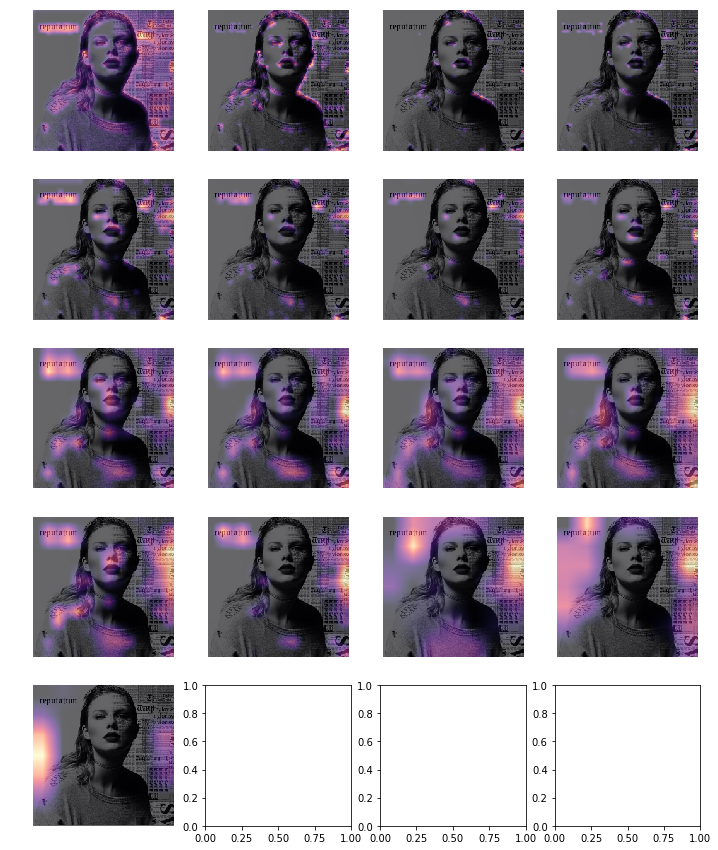



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


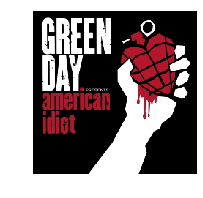

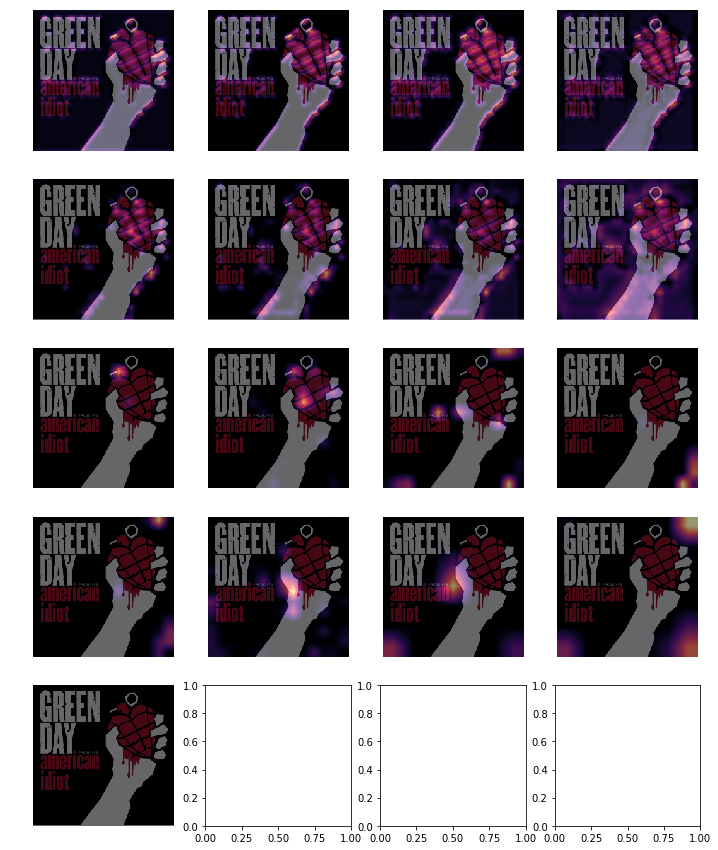




Grad-CAM heat-maps for maximising --> rock <-- score.


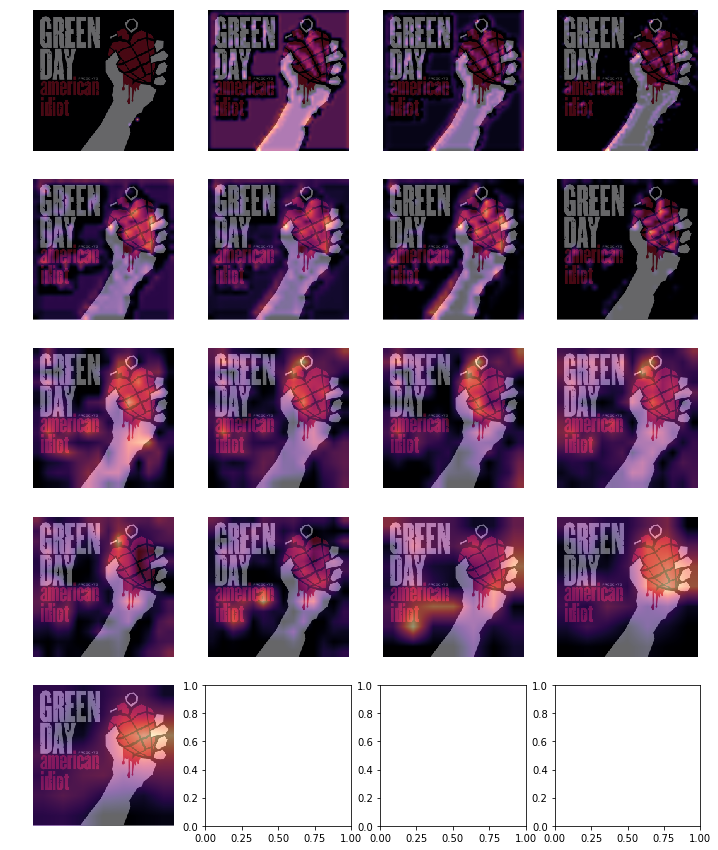



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


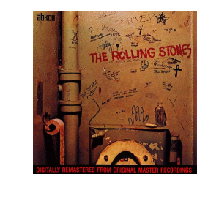

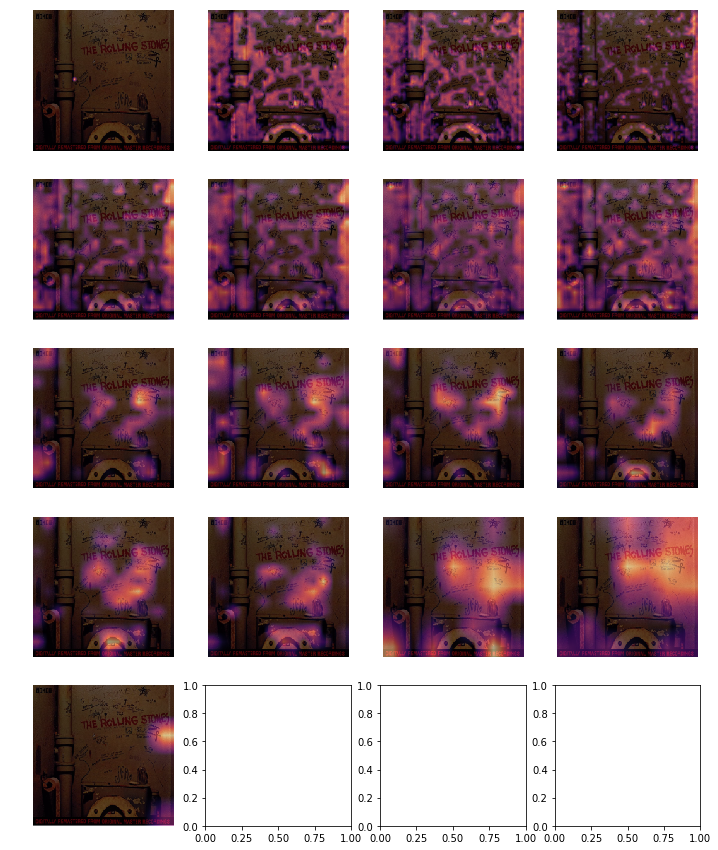




Grad-CAM heat-maps for maximising --> rock <-- score.


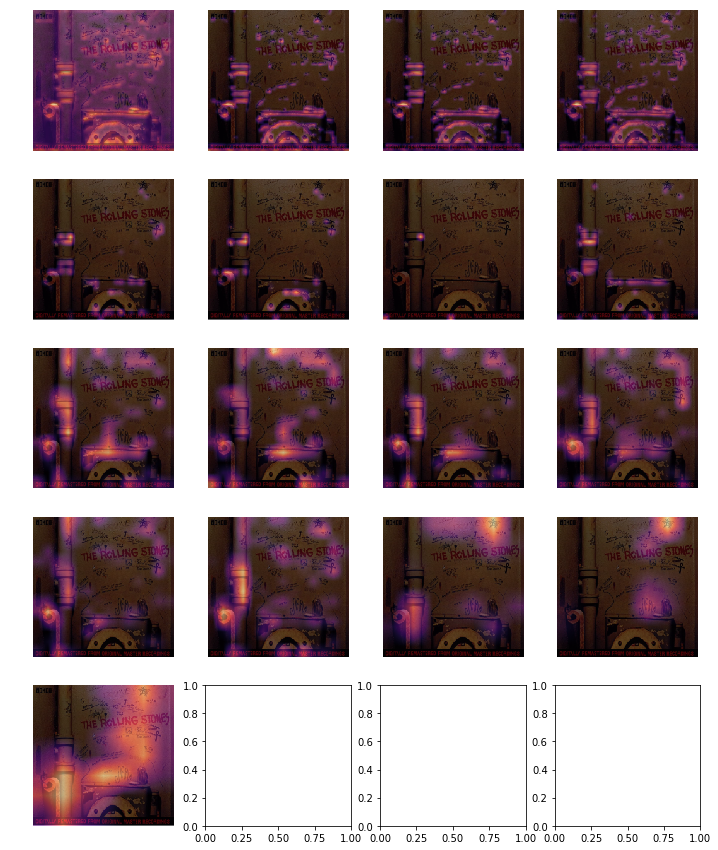



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


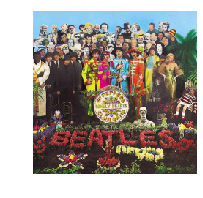

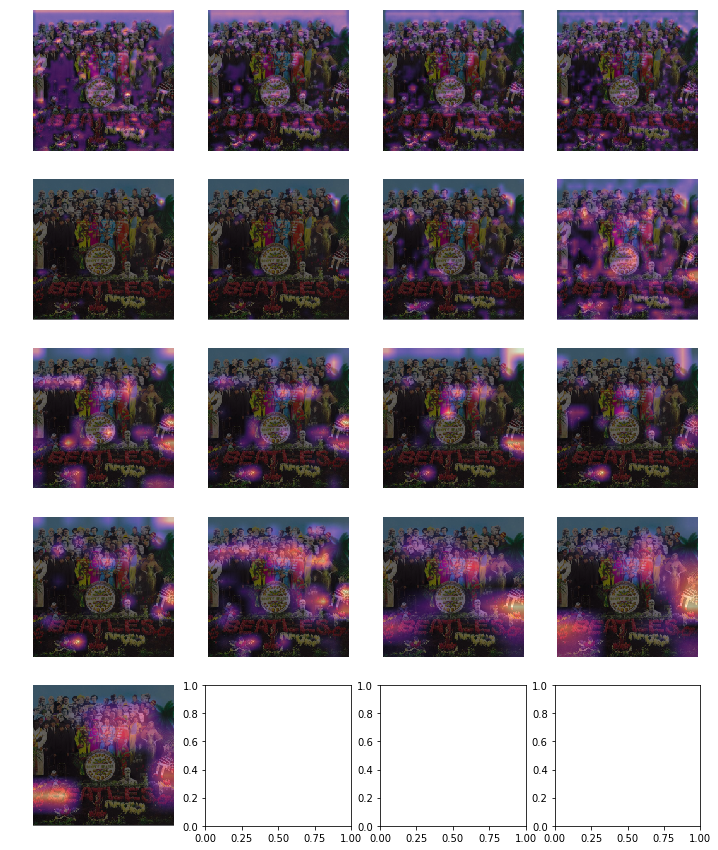




Grad-CAM heat-maps for maximising --> rock <-- score.


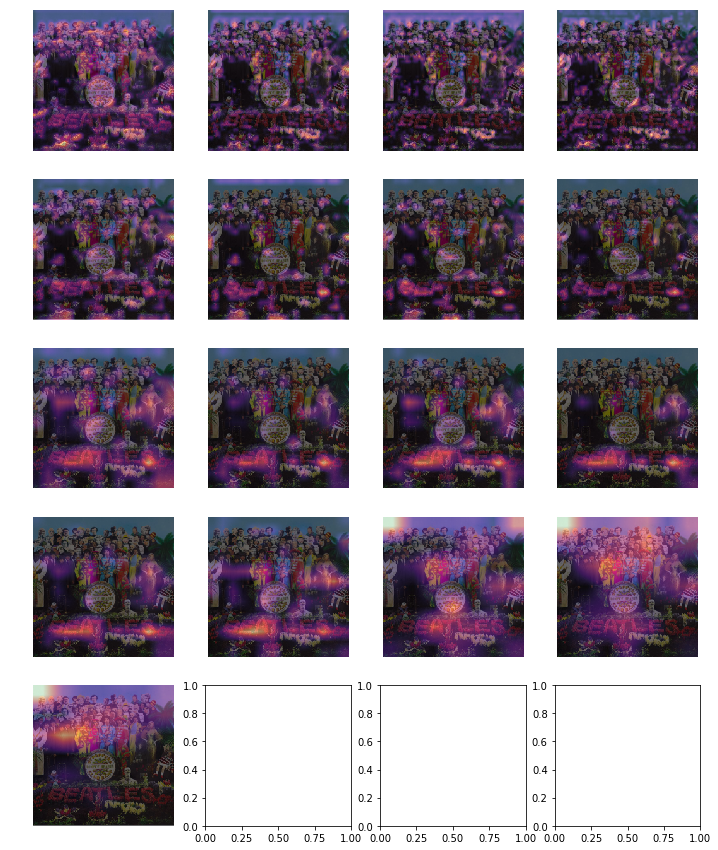



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


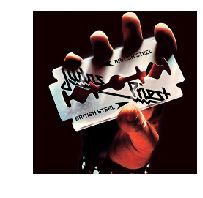

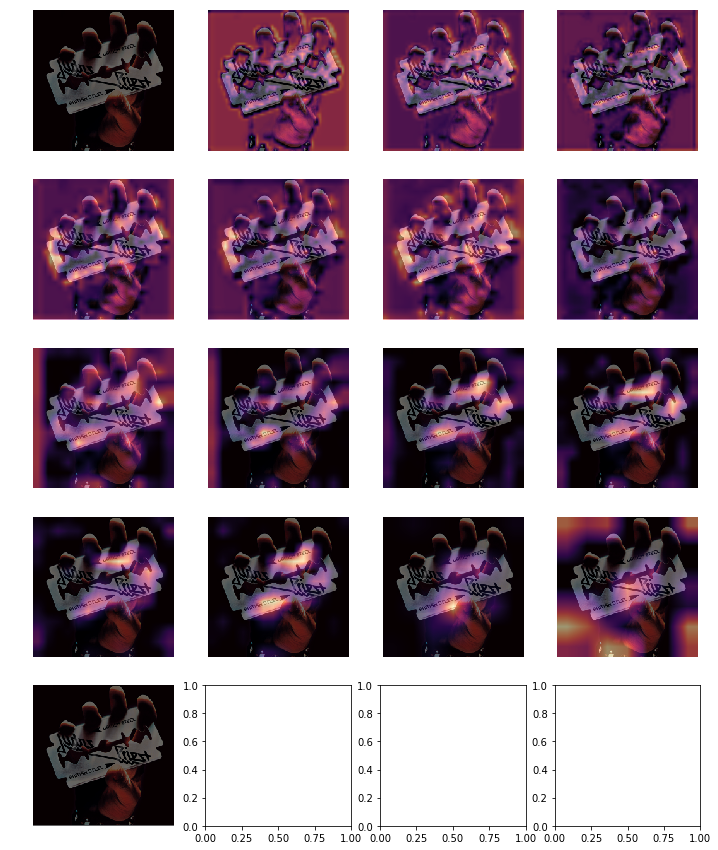




Grad-CAM heat-maps for maximising --> rock <-- score.


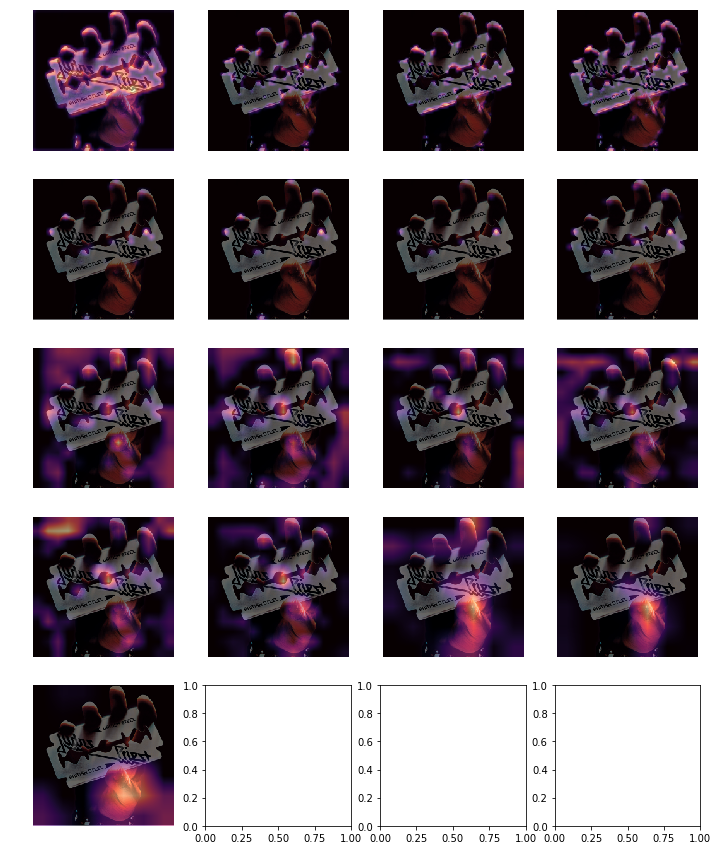



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


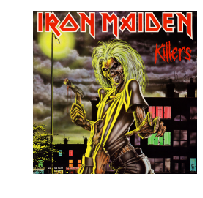

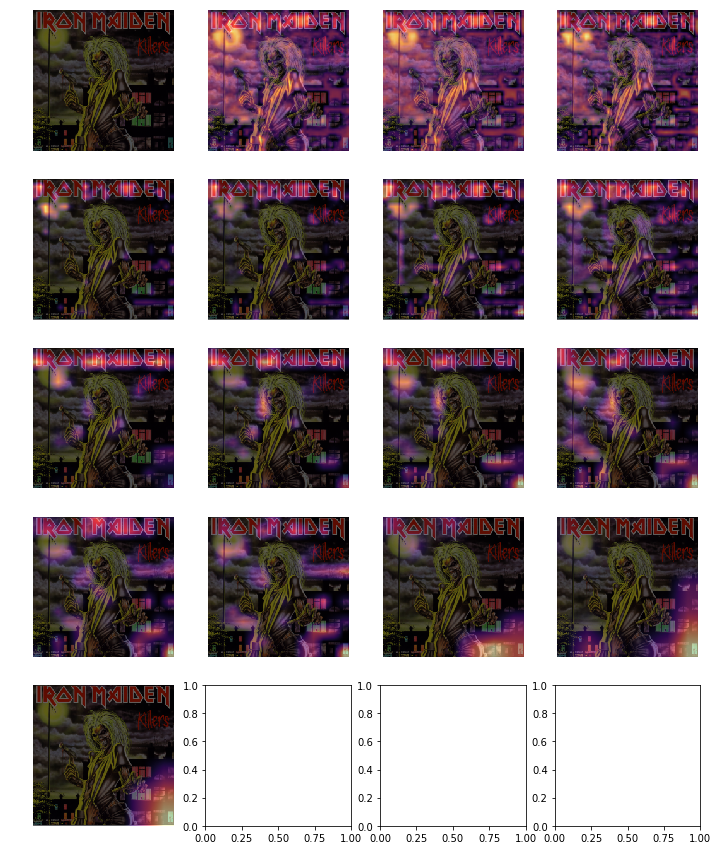




Grad-CAM heat-maps for maximising --> rock <-- score.


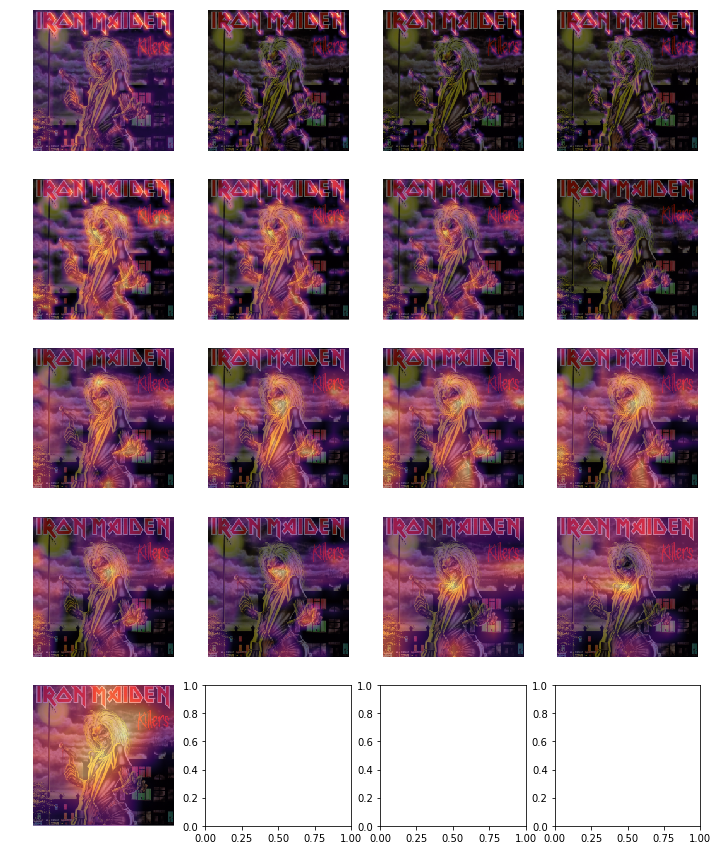



		-------------



Model classifies it as popular.
Grad-CAM heat-maps for maximising --> popular <-- score.


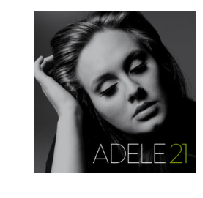

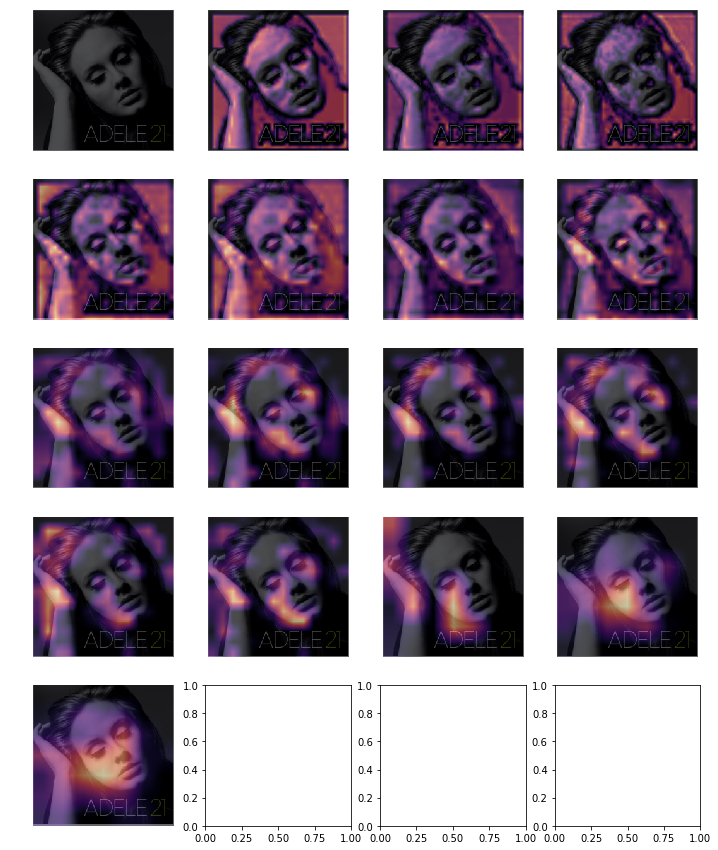




Grad-CAM heat-maps for maximising --> rock <-- score.


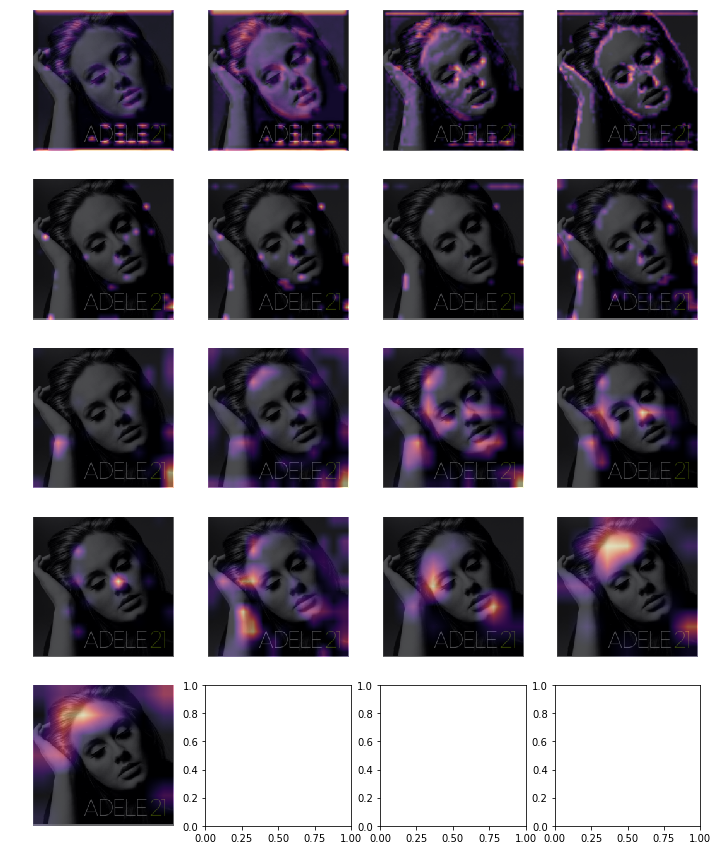



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


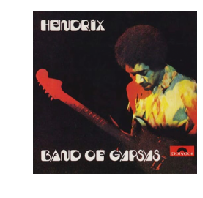

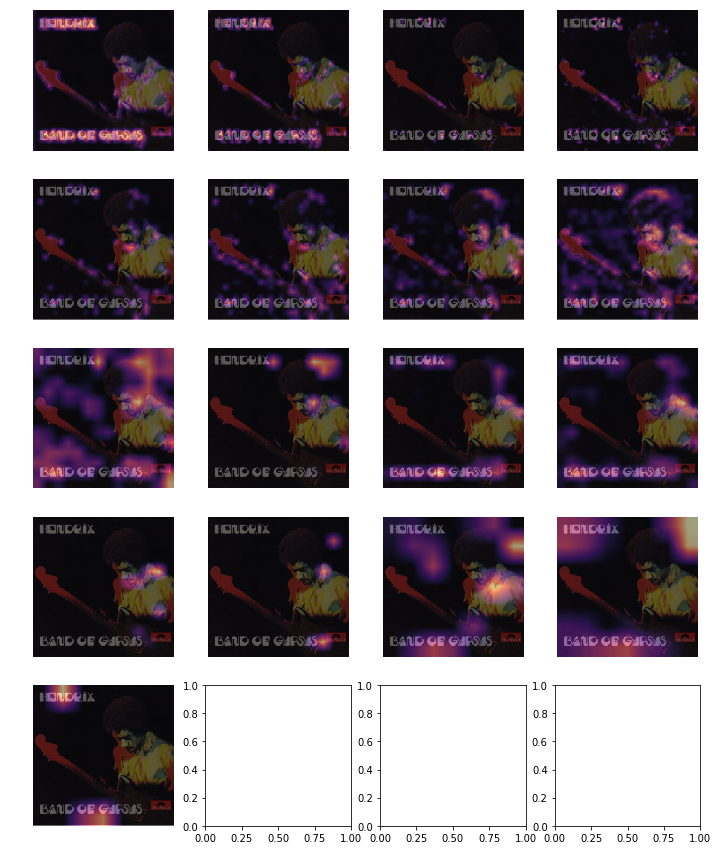




Grad-CAM heat-maps for maximising --> rock <-- score.


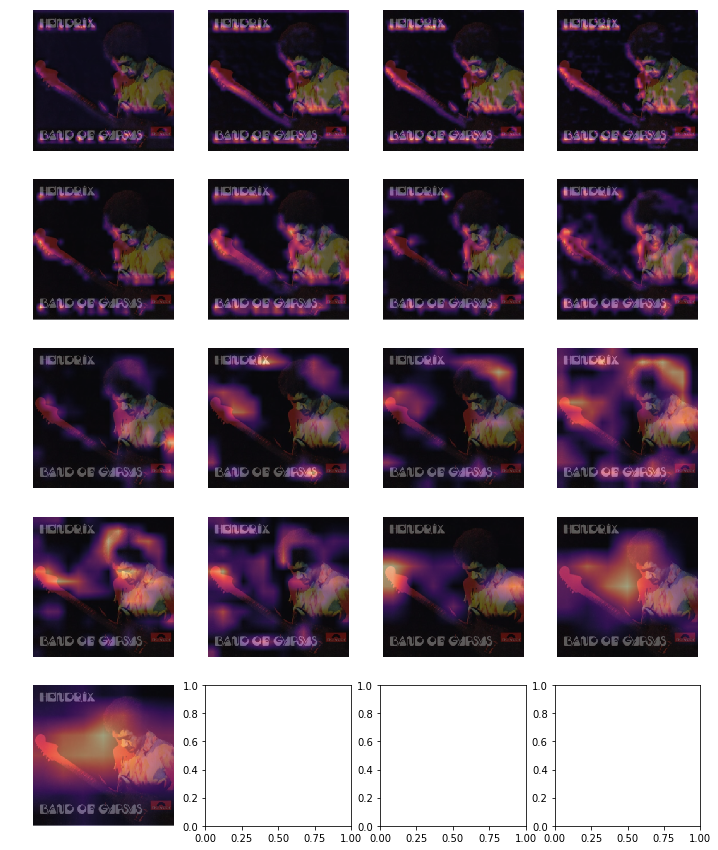



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


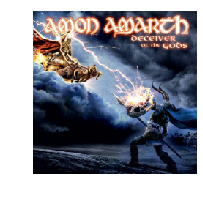

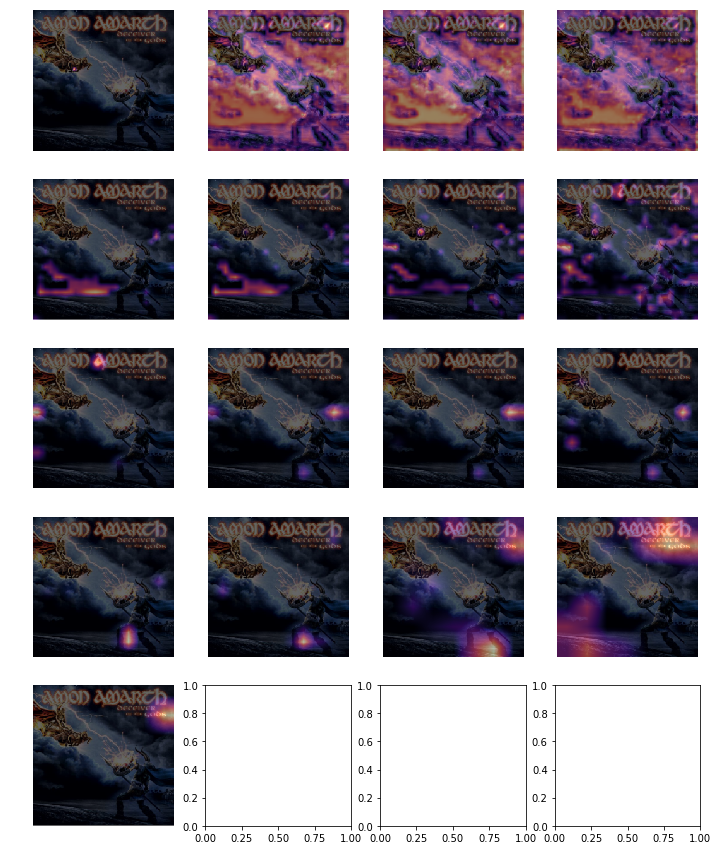




Grad-CAM heat-maps for maximising --> rock <-- score.


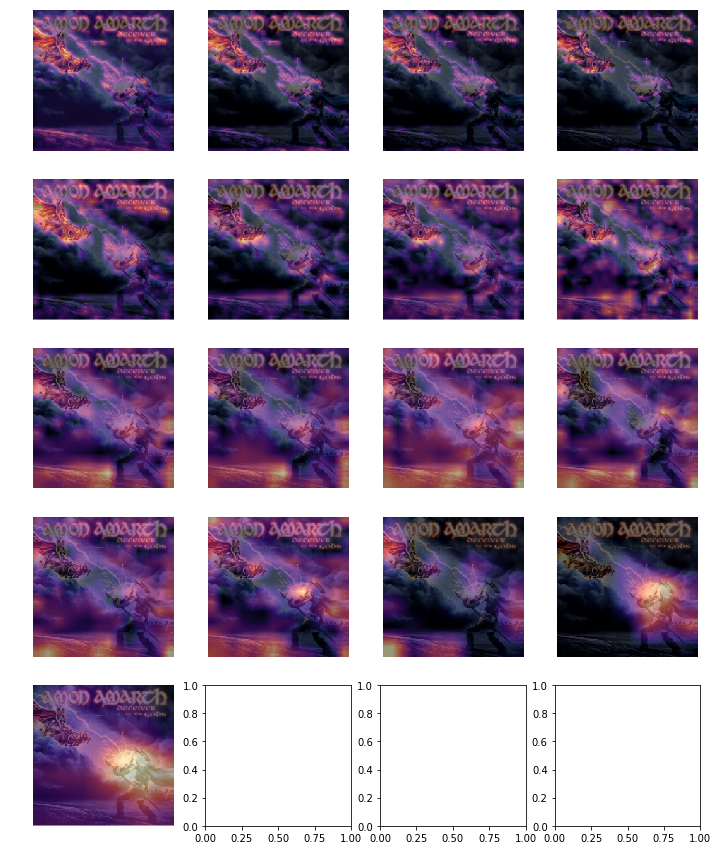



		-------------



Model classifies it as rock.
Grad-CAM heat-maps for maximising --> popular <-- score.


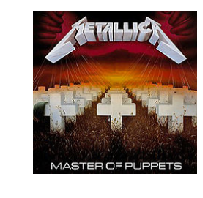

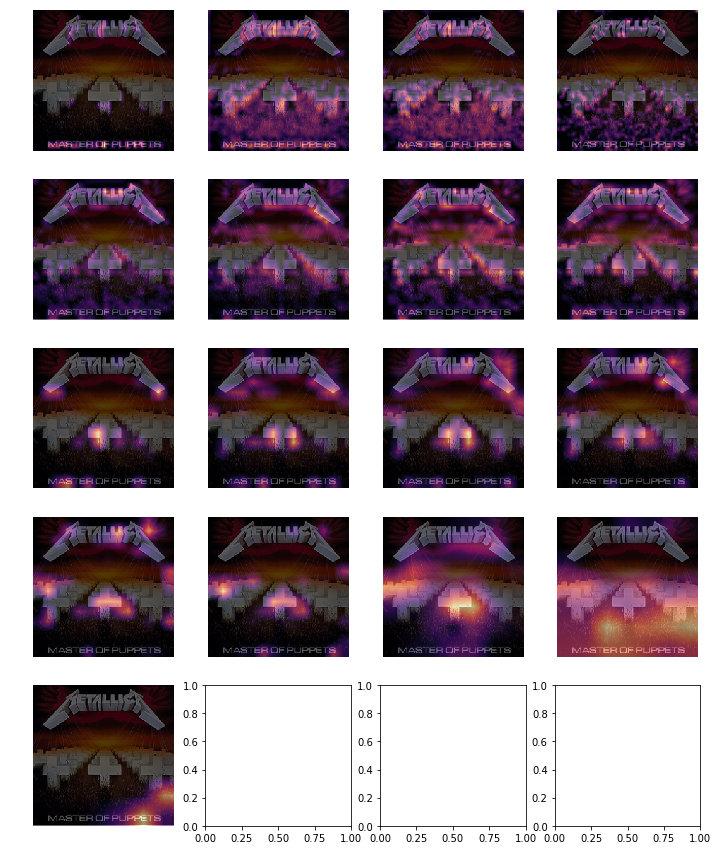




Grad-CAM heat-maps for maximising --> rock <-- score.


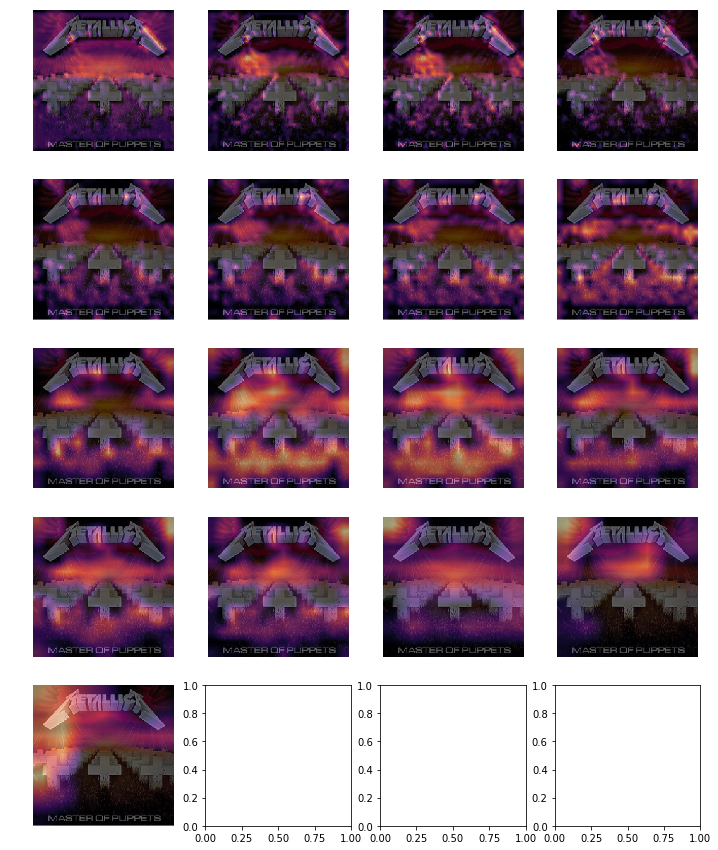



		-------------



Model classifies it as popular.
Grad-CAM heat-maps for maximising --> popular <-- score.


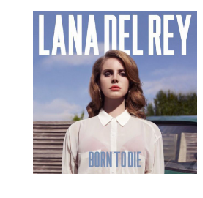

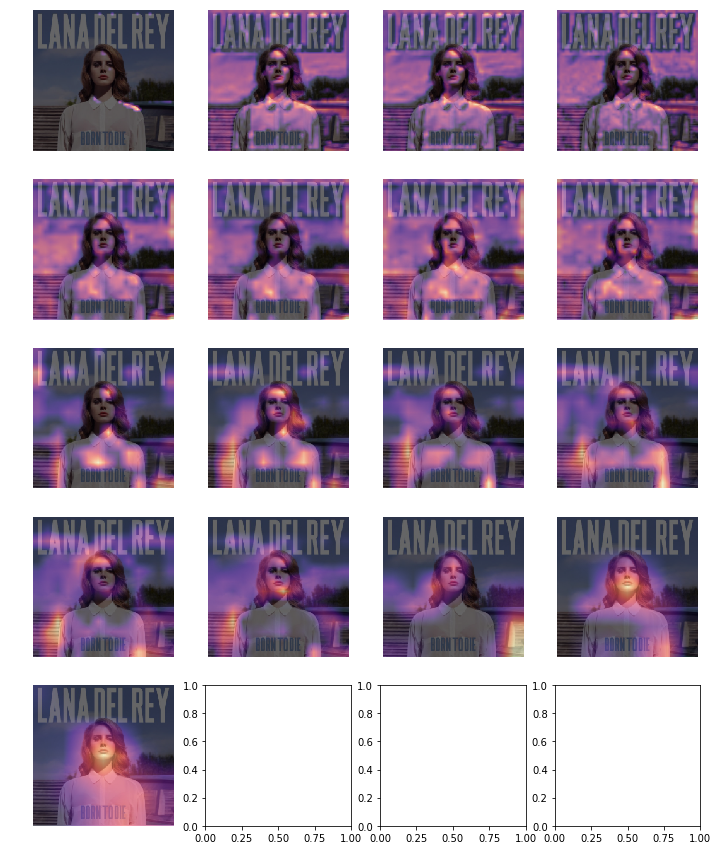




Grad-CAM heat-maps for maximising --> rock <-- score.


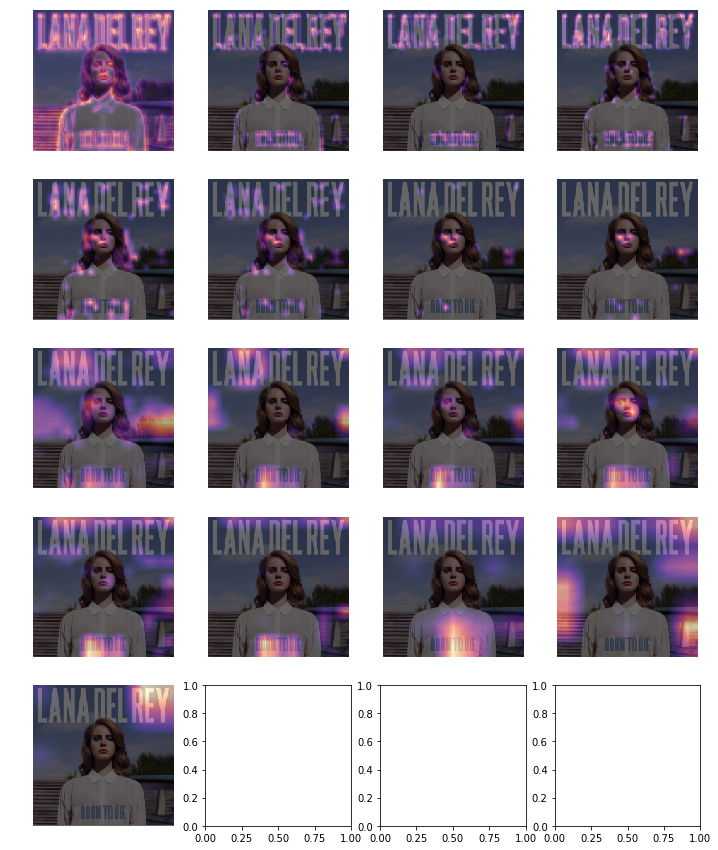



		-------------




In [130]:
for img in test_path.ls():
    plot_for_both_classes(img)

## References:
- [Grad-CAM:
Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391)
- [fastai's Deep Learning Part-1 (2018) MOOC](https://www.fast.ai/)